# **YOLO-NAS:**

In [ ]:
!nvidia-smi

Fri Mar  8 06:22:51 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   38C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
!pip install -U -q supervision onemetric git+https://github.com/Deci-AI/super-gradients.git@stable

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


In [ ]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [ ]:
!unzip -q drive/MyDrive/DP/VEGA/data/YOLO/boxes/digits_original_crops.zip
!unzip -q drive/MyDrive/DP/VEGA/data/YOLO/boxes/glyphs_original_crops.zip

In [ ]:
from super_gradients.training import models, Trainer
from super_gradients.common.object_names import Models
from super_gradients.training.dataloaders.dataloaders import coco_detection_yolo_format_train, coco_detection_yolo_format_val
from super_gradients.training.losses import PPYoloELoss
from super_gradients.training.metrics import DetectionMetrics_050
from super_gradients.training.models.detection_models.pp_yolo_e import PPYoloEPostPredictionCallback
from onemetric.cv.object_detection import ConfusionMatrix
from supervision import Detections, DetectionDataset, InferenceSlicer, BoxAnnotator, MaskAnnotator, plot_image
from supervision.draw.color import Color, ColorPalette
from PIL import Image
import numpy as np
import torch
import cv2
print(f"CUDA : {torch.cuda.is_available()}")

CUDA : True


## Digits:

In [ ]:
dataset_params = {
    "data_dir":"/content/digits_original_crops",
    "train_images_dir":"train/images",
    "train_labels_dir":"train/labels",
    "val_images_dir":"valid/images",
    "val_labels_dir":"valid/labels",
    "test_images_dir":"test/images",
    "test_labels_dir":"test/labels",
    "classes": ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9']
}

In [ ]:
train_data = coco_detection_yolo_format_train(
    dataset_params={
        "data_dir": dataset_params["data_dir"],
        "images_dir": dataset_params["train_images_dir"],
        "labels_dir": dataset_params["train_labels_dir"],
        "classes": dataset_params["classes"]
    },
    dataloader_params={
        "batch_size": 8,
        "num_workers": 2
    }
)

val_data = coco_detection_yolo_format_val(
    dataset_params={
        "data_dir": dataset_params["data_dir"],
        "images_dir": dataset_params["val_images_dir"],
        "labels_dir": dataset_params["val_labels_dir"],
        "classes": dataset_params["classes"]
    },
    dataloader_params={
        "batch_size": 8,
        "num_workers": 2
    }
)

test_data = coco_detection_yolo_format_val(
    dataset_params={
        "data_dir": dataset_params["data_dir"],
        "images_dir": dataset_params["test_images_dir"],
        "labels_dir": dataset_params["test_labels_dir"],
        "classes": dataset_params["classes"]
    },
    dataloader_params={
        "batch_size": 8,
        "num_workers": 2
    }
)

[2024-03-04 22:09:11] INFO - detection_dataset.py - Dataset Initialization in progress. `cache_annotations=True` causes the process to take longer due to full dataset indexing.
Indexing dataset annotations: 100%|██████████| 2107/2107 [00:01<00:00, 1737.24it/s]
[2024-03-04 22:09:12] INFO - detection_dataset.py - Dataset Initialization in progress. `cache_annotations=True` causes the process to take longer due to full dataset indexing.
Indexing dataset annotations: 100%|██████████| 452/452 [00:00<00:00, 5274.97it/s]
[2024-03-04 22:09:12] INFO - detection_dataset.py - Dataset Initialization in progress. `cache_annotations=True` causes the process to take longer due to full dataset indexing.
Indexing dataset annotations: 100%|██████████| 451/451 [00:00<00:00, 5443.01it/s]


In [ ]:
trainer = Trainer(experiment_name="yolo_nas_l_vega_digits", ckpt_root_dir="checkpoints/")

In [ ]:
digits_model = models.get(
    'yolo_nas_l',
    num_classes=len(dataset_params['classes']),
    checkpoint_path='/content/drive/MyDrive/DP/VEGA/weights/yolo_nas_digits_best.pth'
)

[2024-03-04 22:11:20] INFO - checkpoint_utils.py - Successfully loaded model weights from /content/drive/MyDrive/DP/VEGA/weights/yolo_nas_digits_best.pth EMA checkpoint.


In [ ]:
trainer.test(
    model=digits_model,
    test_loader=test_data,
    test_metrics_list=DetectionMetrics_050(
        score_thres=0.1,
        top_k_predictions=300,
        num_cls=len(dataset_params['classes']),
        normalize_targets=True,
        post_prediction_callback=PPYoloEPostPredictionCallback(
            score_threshold=0.01,
            nms_top_k=1000,
            max_predictions=300,
            nms_threshold=0.7
        )
    )
)

Testing:  98%|█████████▊| 56/57 [00:23<00:00,  2.90it/s]

{'Precision@0.50': 0.14681105315685272,
 'Recall@0.50': 0.9993457794189453,
 'mAP@0.50': 0.9813652038574219,
 'F1@0.50': 0.25418609380722046,
 'Best_score_threshold': 0.7099999785423279}

Testing: 100%|██████████| 57/57 [00:24<00:00,  2.36it/s]


[2024-03-04 22:20:19] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


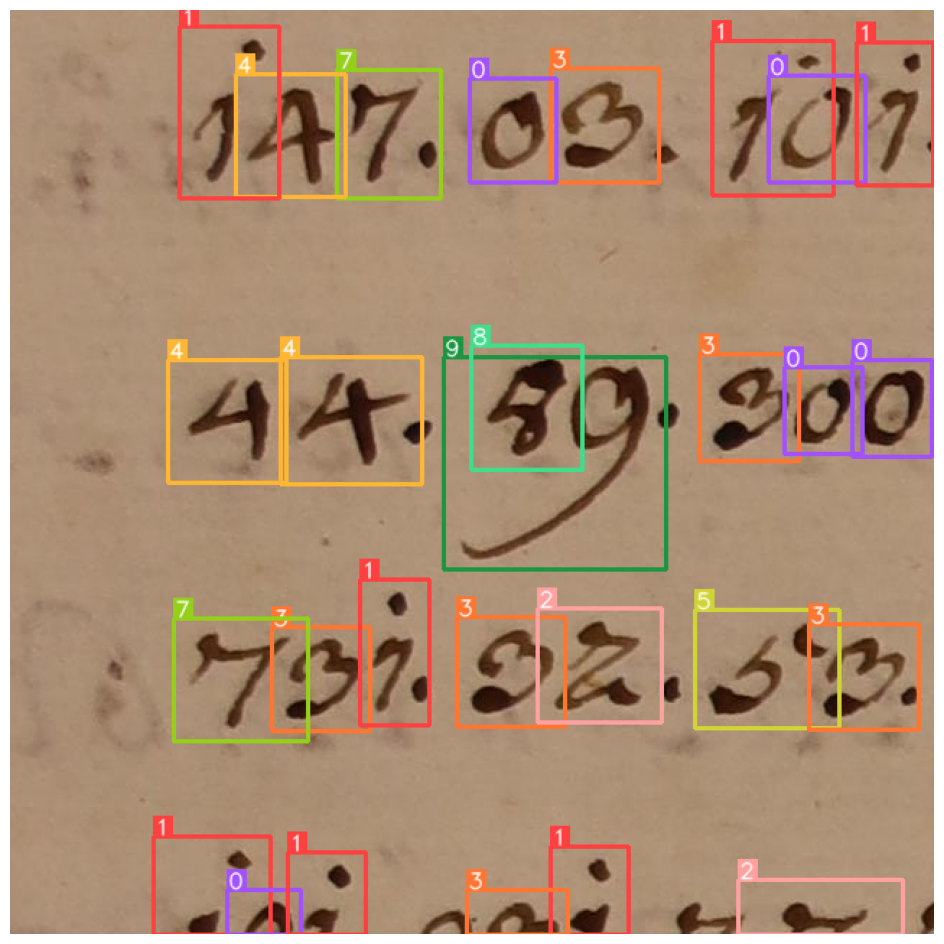

In [ ]:
digits_detections = Detections.from_yolo_nas(
    digits_model.predict(
        images="/content/digits_original_crops/test/images/IMG_1396_col320_row2240_jpg.rf.544b449487d06932a6292e1ef744ab20.jpg",
        conf=0.25
    )
)

digits_annotated_array = BoxAnnotator(
    text_color=Color.WHITE,
    thickness=2,
    text_scale=0.5,
    text_thickness=1,
    text_padding=1
).annotate(
    scene=cv2.imread("/content/digits_original_crops/test/images/IMG_1396_col320_row2240_jpg.rf.544b449487d06932a6292e1ef744ab20.jpg"),
    detections=digits_detections
)
plot_image(digits_annotated_array)

[2024-03-04 22:39:52] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


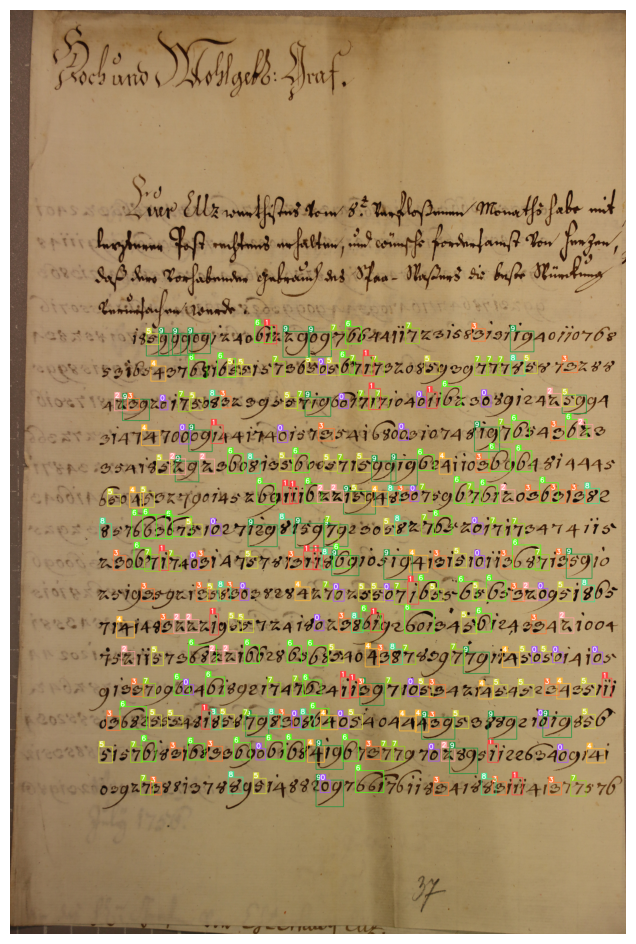

In [ ]:
digits_detections = Detections.from_yolo_nas(
    digits_model.predict(
        images="/content/IMG_1451.jpg",
        conf=0.25,
        skip_image_resizing=True
    )
)

digits_annotated_array = BoxAnnotator(
    text_color=Color.WHITE,
    thickness=4,
    text_scale=1.5,
    text_thickness=3,
    text_padding=3
).annotate(
    scene=cv2.imread("/content/IMG_1451.jpg"),
    detections=digits_detections
)
plot_image(digits_annotated_array)

[2024-03-04 22:40:26] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


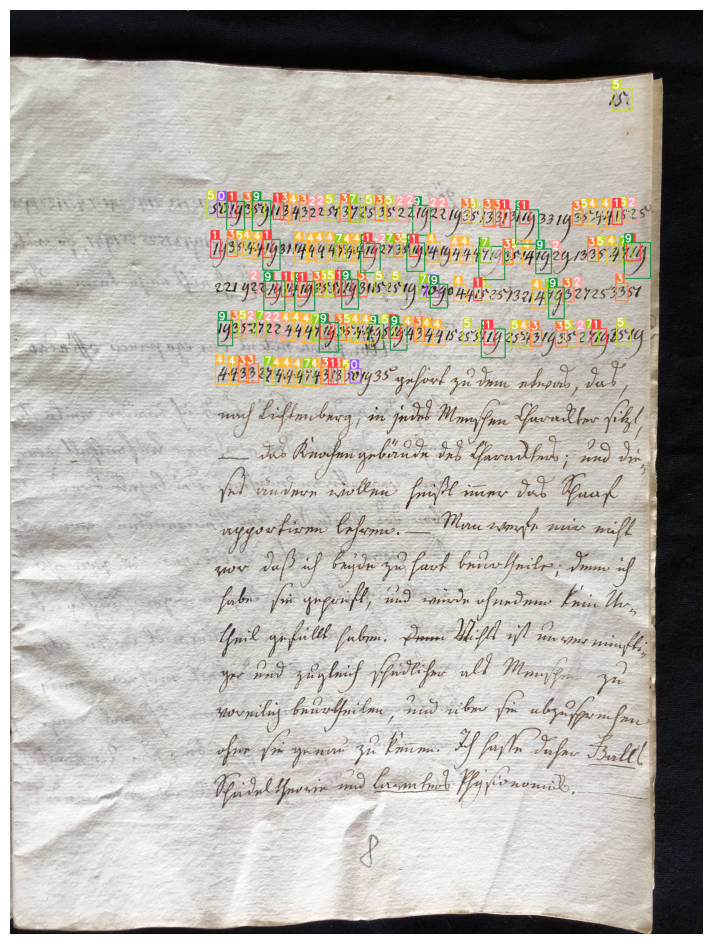

In [ ]:
digits_detections = Detections.from_yolo_nas(
    digits_model.predict(
        images="/content/IMG_4383.JPG",
        conf=0.25,
        skip_image_resizing=True
    )
)

digits_annotated_array = BoxAnnotator(
    text_color=Color.WHITE,
    thickness=4,
    text_scale=1.5,
    text_thickness=3,
    text_padding=3
).annotate(
    scene=cv2.imread("/content/IMG_4383.JPG"),
    detections=digits_detections
)
plot_image(digits_annotated_array)

## SAHI Digits:

In [ ]:
def digits_model_callback(x: np.ndarray) -> Detections:
    result = digits_model.predict(x, conf=0.25)
    return Detections.from_yolo_nas(result)

In [ ]:
digits_sahi_model = InferenceSlicer(
    callback=digits_model_callback,
    slice_wh=(160, 160),
    overlap_ratio_wh=(0.3, 0.3)
)

[2024-03-04 22:42:33] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2024-03-04 22:42:33] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2024-03-04 22:42:33] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2024-03-04 22:42:33] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2024-03-04 22:42:34] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2024-03-04 22:42:34] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2024-03-04 22:42:34] INFO -

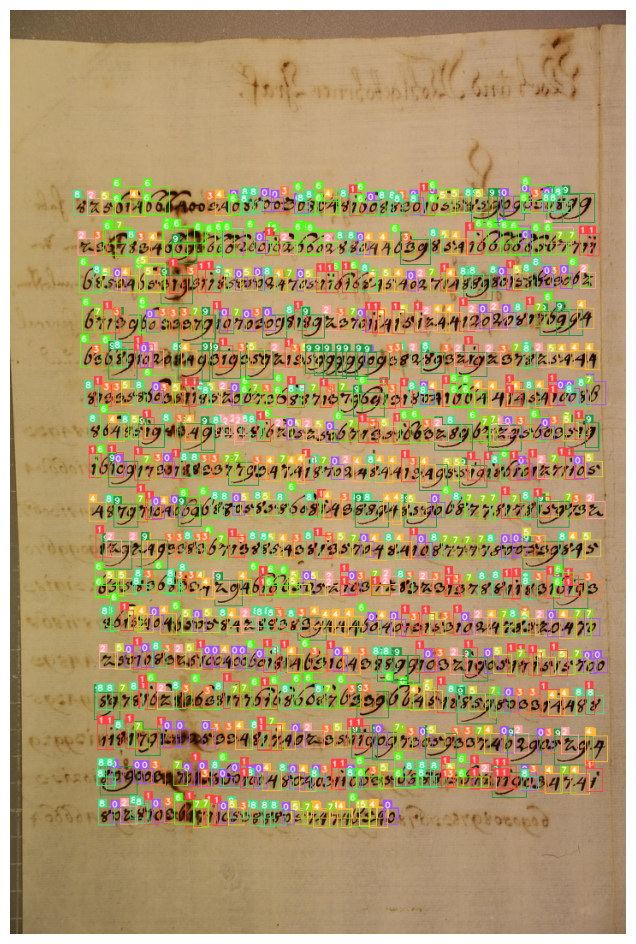

In [ ]:
digits_sahi_detections = digits_sahi_model(
    image=cv2.imread("/content/drive/MyDrive/DP/VEGA/data/BENCHMARK/digits1.jpg"),
)

digits_annotated_array = BoxAnnotator(
    text_color=Color.WHITE,
    thickness=1,
    text_scale=0.3,
    text_thickness=1,
    text_padding=1
).annotate(
    scene=cv2.imread("/content/drive/MyDrive/DP/VEGA/data/BENCHMARK/digits1.jpg"),
    detections=digits_sahi_detections
)
plot_image(digits_annotated_array)

[2024-03-04 22:43:39] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2024-03-04 22:43:40] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2024-03-04 22:43:40] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2024-03-04 22:43:40] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2024-03-04 22:43:40] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2024-03-04 22:43:40] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2024-03-04 22:43:41] INFO -

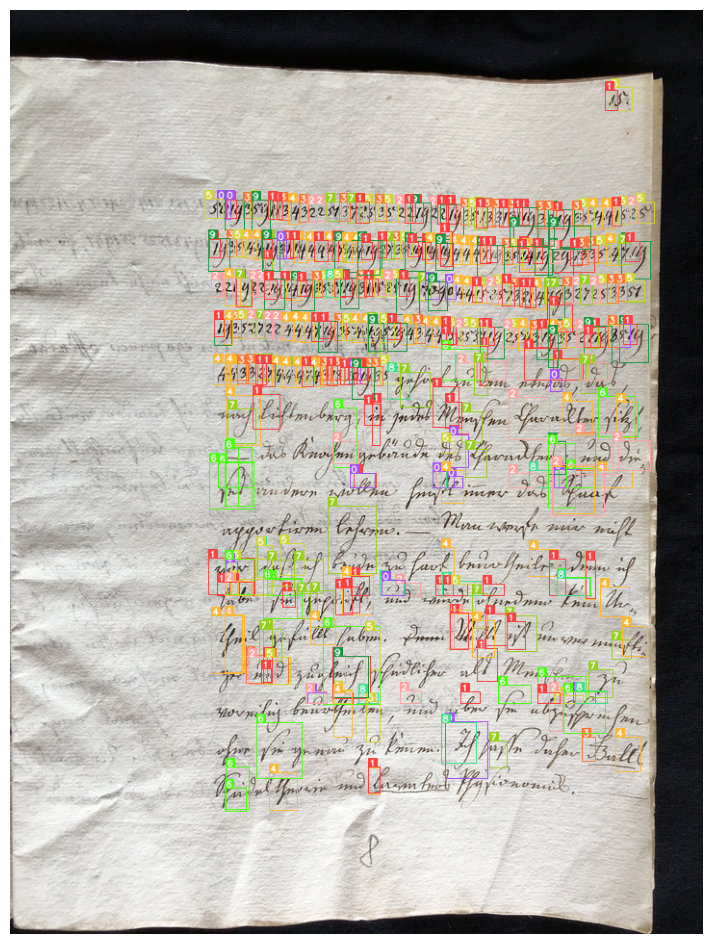

In [ ]:
digits_sahi_detections = digits_sahi_model(
    image=cv2.imread("/content/drive/MyDrive/DP/VEGA/data/BENCHMARK/letter7.jpg"),
)

digits_annotated_array = BoxAnnotator(
    text_color=Color.WHITE,
    thickness=1,
    text_scale=0.3,
    text_thickness=1,
    text_padding=1
).annotate(
    scene=cv2.imread("/content/drive/MyDrive/DP/VEGA/data/BENCHMARK/letter7.jpg"),
    detections=digits_sahi_detections
)
plot_image(digits_annotated_array)

## Glyphs:

In [ ]:
dataset_params = {
    "data_dir":"/content/glyphs_original_crops",
    "train_images_dir":"train/images",
    "train_labels_dir":"train/labels",
    "val_images_dir":"valid/images",
    "val_labels_dir":"valid/labels",
    "test_images_dir":"test/images",
    "test_labels_dir":"test/labels",
    "classes": ['N', 'Q', 'R', 'W', 'Z - -', 'Z - I', 'Z', 'u0023', 'u002a', 'u003d', 'u0043', 'u0054', 'u006d', 'u00d8', 'u0186', 'u01c2 - -', 'u01c2', 'u01c3', 'u0223', 'u0236 - - -', 'u0236 - -', 'u0236', 'u0255', 'u0266', 'u0271 - I', 'u0271', 'u0273', 'u0293', 'u0294', 'u0295', 'u0391', 'u039b', 'u03a5', 'u03a9', 'u03b1', 'u03b2', 'u03b8', 'u03ba', 'u03bb', 'u03c0 D _', 'u03c0', 'u03c6', 'u03c7 - -', 'u03c7', 'u03c9', 'u03f4', 'u03fe', 'u03ff', 'u04ba', 'u0564', 'u06ba - -', 'u06ba', 'u07c2', 'u0ba3', 'u0ce7 - -', 'u0ce7', 'u0e87 - - - -', 'u0e87 - - -', 'u0e87 - -', 'u0e87', 'u0ebd - -', 'u0ebd', 'u10c5', 'u10dd', 'u13ce', 'u1433', 'u146b', 'u1472 U -', 'u1472', 'u1542', 'u1543', 'u1546', 'u166d', 'u1687', 'u1691', 'u1692', 'u1722', 'u1723', 'u1d13', 'u1d133', 'u1d15f R -', 'u1d48', 'u1d78f', 'u1dc9', 'u1f74b', 'u1f75e', 'u1f761', 'u1f76a', 'u2020', 'u2026', 'u20df D I', 'u20df U I', 'u20df', 'u2113', 'u2118', 'u2125', 'u2164', 'u2200', 'u221e - -', 'u221e', 'u2290', 'u2293', 'u2295', 'u22a1', 'u22a5', 'u22b8 L I', 'u231c', 'u231d', 'u2571 R - - -', 'u2571 R - -', 'u2571 R -', 'u25a1', 'u25b3 - _', 'u25b3', 'u25eb', 'u25ec', 'u25ef', 'u2609 D I I I', 'u2609 L - R -', 'u2609 U I I I', 'u2609 U I _ I', 'u2609', 'u260a', 'u263E', 'u263f', 'u2640', 'u2641', 'u2642', 'u2644', 'u2648', 'u264b', 'u264d', 'u2650', 'u2651', 'u2652', 'u26bb', 'u26db', 'u2723', 'u2733', 'u27c6', 'u27d2', 'u27dc R I', 'u27dc', 'u2909', 'u29b5', 'u29b6', 'u29df - I', 'u29df', 'u2a4b', 'u2a68', 'u2ad8', 'u2aef - I', 'u2aef', 'u2af0', 'u2b35', 'u2caf', 'u2cc0 - -', 'u2cc0', 'u3059', 'ua609', 'ua72b', 'ufeea']
}

In [ ]:
train_data = coco_detection_yolo_format_train(
    dataset_params={
        "data_dir": dataset_params["data_dir"],
        "images_dir": dataset_params["train_images_dir"],
        "labels_dir": dataset_params["train_labels_dir"],
        "classes": dataset_params["classes"]
    },
    dataloader_params={
        "batch_size": 8,
        "num_workers": 2
    }
)

val_data = coco_detection_yolo_format_val(
    dataset_params={
        "data_dir": dataset_params["data_dir"],
        "images_dir": dataset_params["val_images_dir"],
        "labels_dir": dataset_params["val_labels_dir"],
        "classes": dataset_params["classes"]
    },
    dataloader_params={
        "batch_size": 8,
        "num_workers": 2
    }
)

test_data = coco_detection_yolo_format_val(
    dataset_params={
        "data_dir": dataset_params["data_dir"],
        "images_dir": dataset_params["test_images_dir"],
        "labels_dir": dataset_params["test_labels_dir"],
        "classes": dataset_params["classes"]
    },
    dataloader_params={
        "batch_size": 8,
        "num_workers": 2
    }
)

[2024-03-05 07:44:33] INFO - detection_dataset.py - Dataset Initialization in progress. `cache_annotations=True` causes the process to take longer due to full dataset indexing.
Indexing dataset annotations: 100%|██████████| 7591/7591 [00:01<00:00, 6184.01it/s]
[2024-03-05 07:44:34] INFO - detection_dataset.py - Dataset Initialization in progress. `cache_annotations=True` causes the process to take longer due to full dataset indexing.
Indexing dataset annotations: 100%|██████████| 1627/1627 [00:02<00:00, 555.68it/s]
[2024-03-05 07:44:37] INFO - detection_dataset.py - Dataset Initialization in progress. `cache_annotations=True` causes the process to take longer due to full dataset indexing.
Indexing dataset annotations: 100%|██████████| 1627/1627 [00:01<00:00, 867.33it/s]


In [ ]:
trainer = Trainer(experiment_name="yolo_nas_l_vega_glyphs", ckpt_root_dir="checkpoints/")

In [ ]:
glyphs_model = models.get(
    'yolo_nas_l',
    num_classes=len(dataset_params['classes']),
    checkpoint_path='/content/drive/MyDrive/DP/VEGA/weights/yolo_nas_glyphs_best.pth'
)

[2024-03-05 07:44:51] INFO - checkpoint_utils.py - Successfully loaded model weights from /content/drive/MyDrive/DP/VEGA/weights/yolo_nas_glyphs_best.pth EMA checkpoint.


In [ ]:
trainer.test(
    model=glyphs_model,
    test_loader=test_data,
    test_metrics_list=DetectionMetrics_050(
        score_thres=0.1,
        top_k_predictions=300,
        num_cls=len(dataset_params['classes']),
        normalize_targets=True,
        post_prediction_callback=PPYoloEPostPredictionCallback(
            score_threshold=0.01,
            nms_top_k=1000,
            max_predictions=300,
            nms_threshold=0.7
        )
    )
)

Testing: 100%|██████████| 204/204 [01:13<00:00,  2.77it/s]


{'Precision@0.50': 0.09005425870418549,
 'Recall@0.50': 0.9984742999076843,
 'mAP@0.50': 0.9557721018791199,
 'F1@0.50': 0.1605115383863449,
 'Best_score_threshold': 0.7300000190734863}

[2024-03-05 07:46:36] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


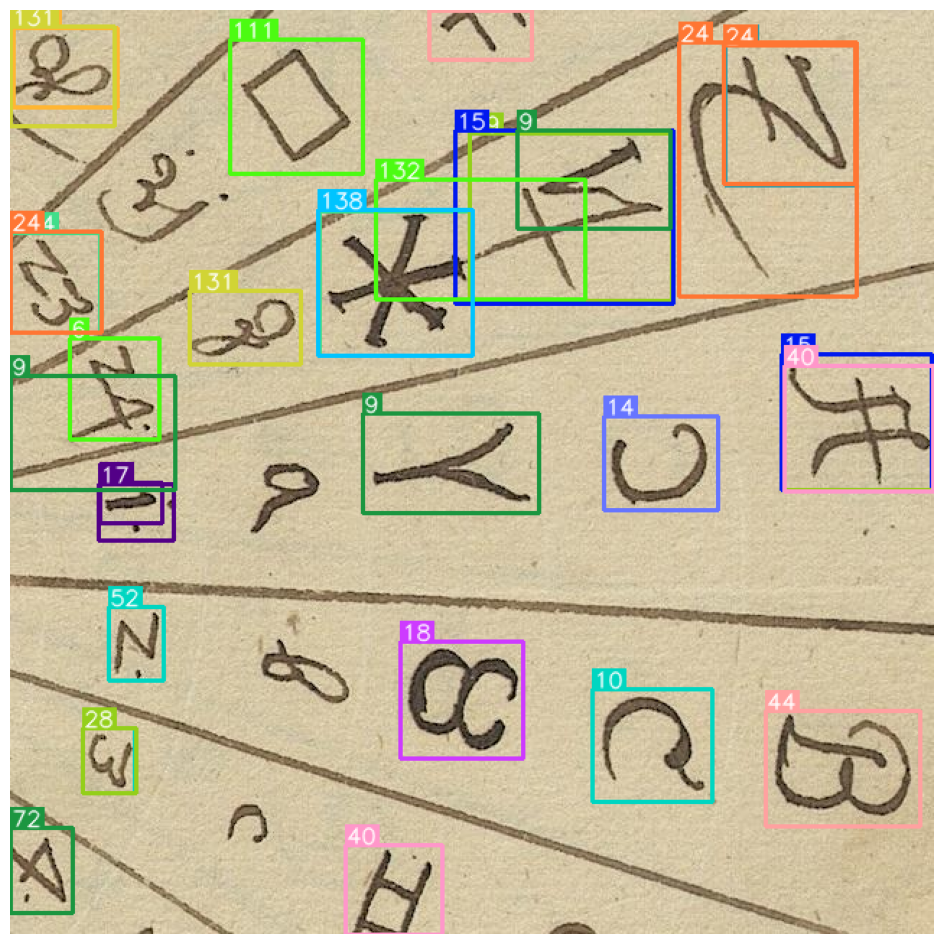

In [ ]:
glyphs_detections = Detections.from_yolo_nas(
    glyphs_model.predict(
        images="/content/glyphs_original_crops/test/images/hhstaw_130_i_1576_0089_jpg_col1600_row1600_jpg.rf.40fc3cd09c8d0440a4cea59cad864d2f.jpg",
        conf=0.25
    )
)

glyphs_annotated_array = BoxAnnotator(
    text_color=Color.WHITE,
    thickness=2,
    text_scale=0.5,
    text_thickness=1,
    text_padding=1
).annotate(
    scene=cv2.imread("/content/glyphs_original_crops/test/images/hhstaw_130_i_1576_0089_jpg_col1600_row1600_jpg.rf.40fc3cd09c8d0440a4cea59cad864d2f.jpg"),
    detections=glyphs_detections
)
plot_image(glyphs_annotated_array)

[2024-03-05 07:51:03] INFO - processing.py - Skipping processing `DetectionLongestMaxSizeRescale` because it resizes the image.
[2024-03-05 07:51:03] INFO - processing.py - Skipping processing `DetectionLongestMaxSizeRescale` because it resizes the image.
[2024-03-05 07:51:03] INFO - processing.py - Skipping processing `DetectionBottomRightPadding` because it resizes the image.
[2024-03-05 07:51:04] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


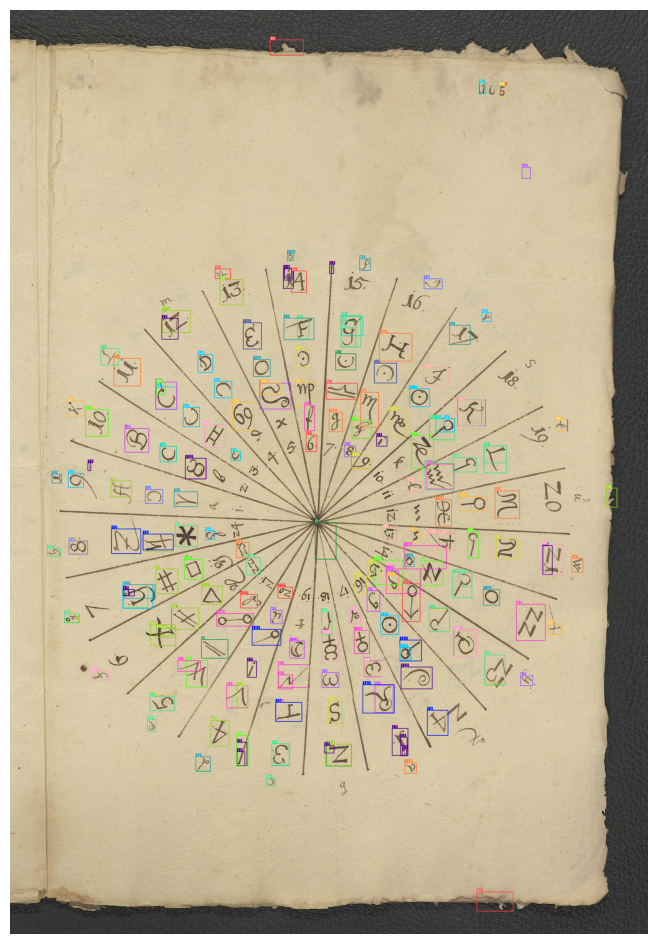

In [ ]:
glyphs_detections = Detections.from_yolo_nas(
    glyphs_model.predict(
        images="/content/hhstaw_130_i_1576_0096.jpg",
        conf=0.25,
        skip_image_resizing=True
    )
)

glyphs_annotated_array = BoxAnnotator(
    text_color=Color.WHITE,
    thickness=2,
    text_scale=0.5,
    text_thickness=1,
    text_padding=1
).annotate(
    scene=cv2.imread("/content/hhstaw_130_i_1576_0096.jpg"),
    detections=glyphs_detections
)
plot_image(glyphs_annotated_array)

## SAHI Glyphs:

In [ ]:
def glyphs_model_callback(x: np.ndarray) -> Detections:
    result = glyphs_model.predict(x, conf=0.25)
    return Detections.from_yolo_nas(result)

In [ ]:
glyphs_sahi_model = InferenceSlicer(
    callback=glyphs_model_callback,
    slice_wh=(160, 160),
    overlap_ratio_wh=(0.3, 0.3)
)

[2024-03-05 07:56:49] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2024-03-05 07:56:50] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2024-03-05 07:56:50] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2024-03-05 07:56:50] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2024-03-05 07:56:51] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2024-03-05 07:56:51] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2024-03-05 07:56:51] INFO -

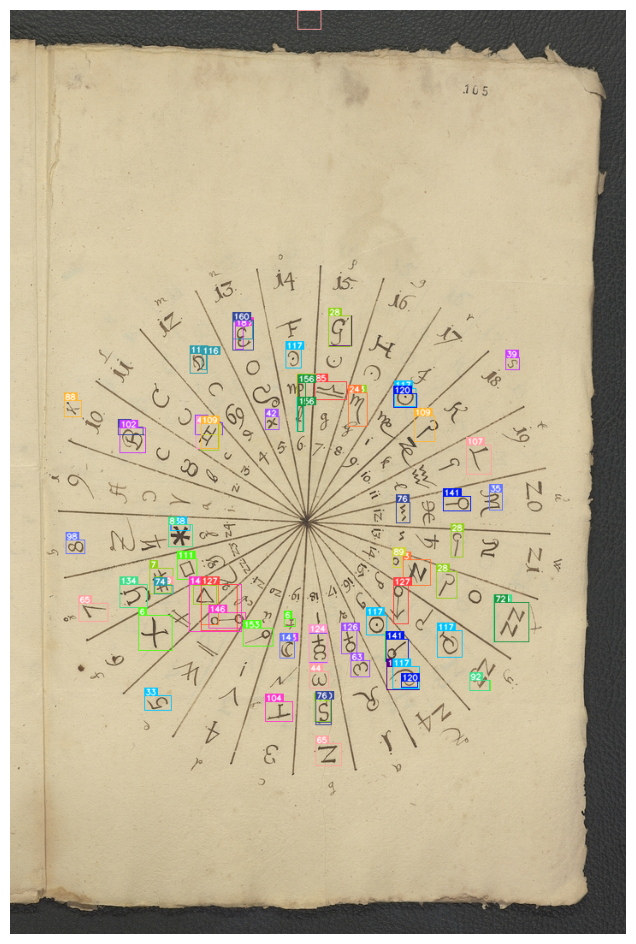

In [ ]:
glyphs_sahi_detections = glyphs_sahi_model(
    image=cv2.imread("/content/drive/MyDrive/DP/VEGA/data/BENCHMARK/glyphs1.jpg"),
)

glyphs_annotated_array = BoxAnnotator(
    text_color=Color.WHITE,
    thickness=1,
    text_scale=0.3,
    text_thickness=1,
    text_padding=1
).annotate(
    scene=cv2.imread("/content/drive/MyDrive/DP/VEGA/data/BENCHMARK/glyphs1.jpg"),
    detections=glyphs_sahi_detections
)
plot_image(glyphs_annotated_array)